# Detectron 2
> [Data set](https://universe.roboflow.com/ia-project-x4wsk/ia-beachbot-2-9depe/dataset/17#)

## GPU

In [1]:
!nvidia-smi

Sat Dec  7 11:30:36 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Install Detectron2 and dependencies

In [2]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-t31xtaqb
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-t31xtaqb
  Resolved https://github.com/facebookresearch/detectron2.git to commit c69939aa85460e8135f40bce908a6cddaa73065f
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.2/79.2 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 11.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 48.9 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp3

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.5 ; cuda:  cu121
detectron2: 0.6


In [4]:
# COMMON LIBRARIES
import os
import cv2

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

## Run a Pre-trained Detectron2 Model

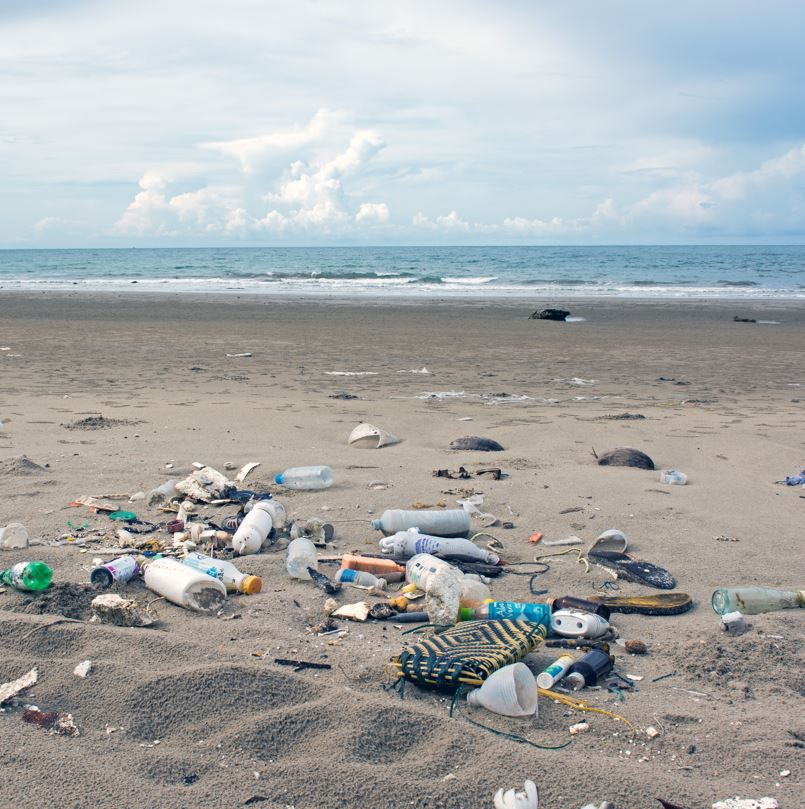

In [5]:
# !wget https://cdn.rri.co.id/berita/38/1671701599-IMG-20221222-WA0045.jpg -q -O input.jpg
!wget https://thecabosun.com/wp-content/uploads/2022/07/7-Trash-on-the-beach.jpg -q -O input.jpg
image = cv2.imread("./input.jpg")
cv2_imshow(image)

In [6]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # Batas Score Threshold
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(image)

model_final_f10217.pkl: 178MB [00:00, 217MB/s]                           
/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [8]:
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([39, 77, 39], device='cuda:0')
Boxes(tensor([[141.4625, 556.2433, 228.0881, 615.5692],
        [400.5704, 550.8114, 492.6181, 627.9175],
        [177.5802, 552.3950, 262.3435, 595.6893]], device='cuda:0'))


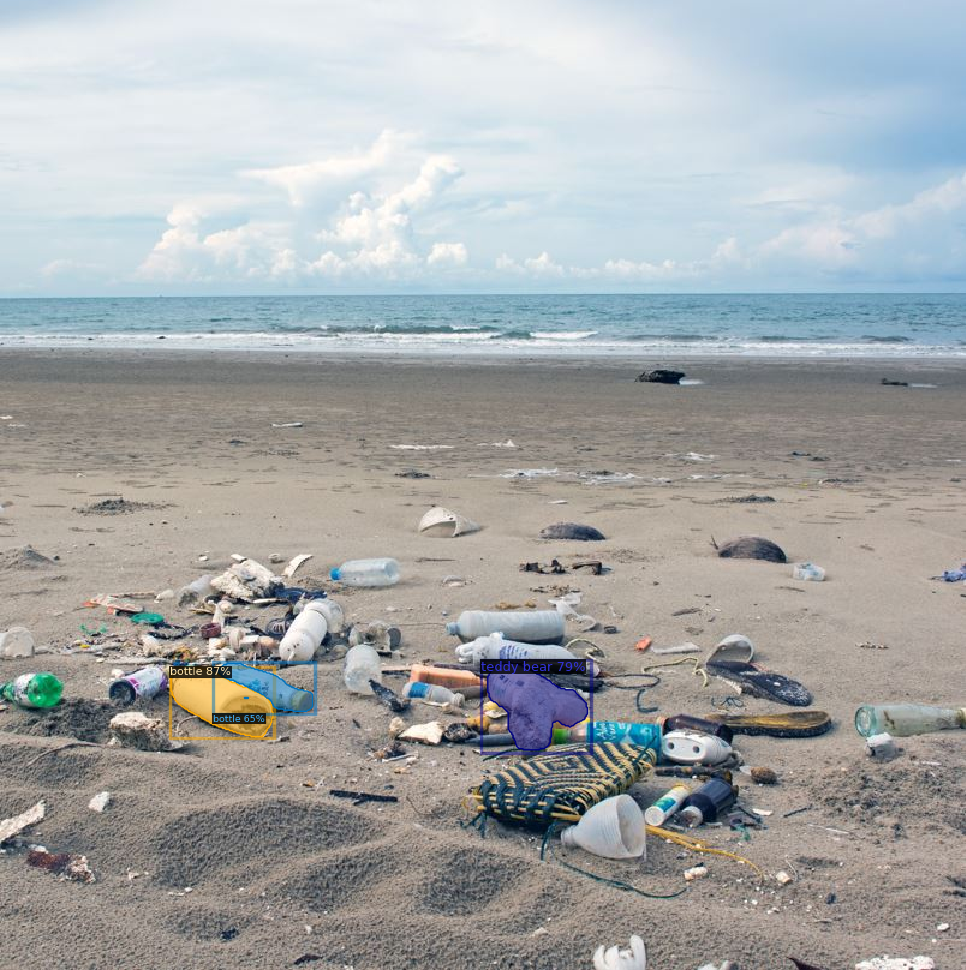

In [9]:
visualizer = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

## COCO Format Dataset

> Data yang digunakan adalah gambar sampah yang berada di pantai. Data di ambil dari [Roboflow Universe](https://universe.roboflow.com/) dengan memilih  Instance Segmentation pada bagian dataset ( ```COCO Segmentation )```
```
dataset-directory/
├─ README.dataset.txt
├─ README.roboflow.txt
├─ train
│  ├─ train-image-1.jpg
│  ├─ train-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
├─ test
│  ├─ test-image-1.jpg
│  ├─ test-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
└─ valid
   ├─ valid-image-1.jpg
   ├─ valid-image-1.jpg
   ├─ ...
   └─ _annotations.coco.json
```

In [10]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="JCJuUIVJTuJk6bMQEF6C")
project = rf.workspace("alvin-fxgjk").project("ia-beachbot2-a7cnm")
version = project.version(1)
dataset = version.download("coco-segmentation")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.1 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ia-beachbot2-1 in coco-segmentation:: 100%|██████████| 8375/8375 [00:01<00:00, 6457.10it/s]


In [12]:
DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"

In [13]:
# TRAIN SET
TRAIN_DATA_SET_NAME = f"{DATA_SET_NAME}-train"
TRAIN_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
TRAIN_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TRAIN_DATA_SET_NAME,
    metadata={},
    json_file=TRAIN_DATA_SET_ANN_FILE_PATH,
    image_root=TRAIN_DATA_SET_IMAGES_DIR_PATH
)

# TEST SET
TEST_DATA_SET_NAME = f"{DATA_SET_NAME}-test"
TEST_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "test")
TEST_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "test", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TEST_DATA_SET_NAME,
    metadata={},
    json_file=TEST_DATA_SET_ANN_FILE_PATH,
    image_root=TEST_DATA_SET_IMAGES_DIR_PATH
)

# VALID SET
VALID_DATA_SET_NAME = f"{DATA_SET_NAME}-valid"
VALID_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "valid")
VALID_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "valid", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=VALID_DATA_SET_NAME,
    metadata={},
    json_file=VALID_DATA_SET_ANN_FILE_PATH,
    image_root=VALID_DATA_SET_IMAGES_DIR_PATH
)

Konfirmasi Dataset dengan [MetadataCatalog](https://detectron2.readthedocs.io/en/latest/modules/data.html#detectron2.data.MetadataCatalog).

In [14]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith(DATA_SET_NAME)
]

['ia-beachbot2-train', 'ia-beachbot2-test', 'ia-beachbot2-valid']

## Visualisasi Image
 > Melihat dari kumpulan data Train

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



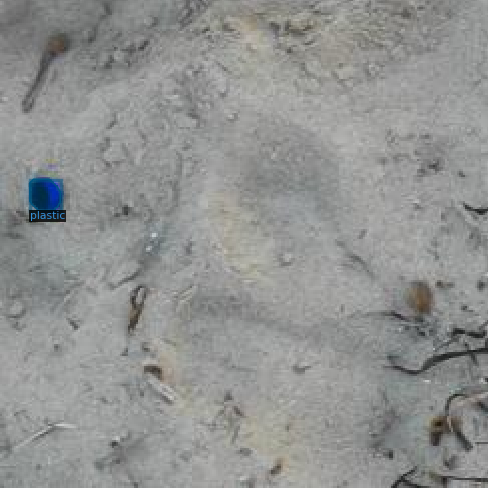

In [15]:
metadata = MetadataCatalog.get(TRAIN_DATA_SET_NAME)
dataset_train = DatasetCatalog.get(TRAIN_DATA_SET_NAME)

dataset_entry = dataset_train[0]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata,
    scale=2,
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

##  Train Model Using Custom COCO Format Dataset

In [17]:
# HYPERPARAMETERS
ARCHITECTURE = "mask_rcnn_R_101_FPN_3x"
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"
MAX_ITER = 1000
EVAL_PERIOD = 200
BASE_LR = 0.001
NUM_CLASSES = 12

# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    DATA_SET_NAME,
    ARCHITECTURE,
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

In [19]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
cfg.DATASETS.TRAIN = (TRAIN_DATA_SET_NAME,)
cfg.DATASETS.TEST = (TEST_DATA_SET_NAME,)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = MAX_ITER
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.OUTPUT_DIR = OUTPUT_DIR_PATH

## Train

In [20]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/07 11:36:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [00:01, 133MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[12/07 11:36:13 d2.engine.train_loop]: Starting training from iteration 0
[12/07 11:36:27 d2.utils.events]:  eta: 0:07:22  iter: 19  total_loss: 4.123  loss_cls: 2.538  loss_box_reg: 0.7933  loss_mask: 0.693  loss_rpn_cls: 0.01726  loss_rpn_loc: 0.005994    time: 0.4594  last_time: 0.4320  data_time: 0.0298  last_data_time: 0.0139   lr: 1.9981e-05  max_mem: 2589M
[12/07 11:36:40 d2.utils.events]:  eta: 0:07:06  iter: 39  total_loss: 3.578  loss_cls: 2.065  loss_box_reg: 0.8138  loss_mask: 0.6813  loss_rpn_cls: 0.01541  loss_rpn_loc: 0.005438    time: 0.4535  last_time: 0.3743  data_time: 0.0128  last_data_time: 0.0137   lr: 3.9961e-05  max_mem: 2589M
[12/07 11:36:49 d2.utils.events]:  eta: 0:06:49  iter: 59  total_loss: 2.786  loss_cls: 1.175  loss_box_reg: 0.8423  loss_mask: 0.6574  loss_rpn_cls: 0.03673  loss_rpn_loc: 0.00981    time: 0.4481  last_time: 0.4795  data_time: 0.0135  last_data_time: 0.0068   lr: 5.9941e-05  max_mem: 2592M
[12/07 11:36:58 d2.utils.events]:  eta: 0:06:43  

In [21]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir $OUTPUT_DIR_PATH

<IPython.core.display.Javascript object>

## Image Data

[12/07 11:45:01 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ia-beachbot2/mask_rcnn_R_101_FPN_3x/2024-12-07-11-36-04/model_final.pth ...


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


WARNING [12/07 11:45:01 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/07 11:45:01 d2.data.datasets.coco]: Loaded 511 images in COCO format from /content/ia-beachbot2-1/valid/_annotations.coco.json


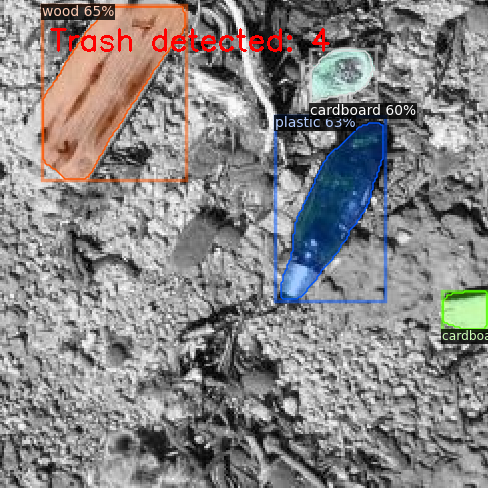

In [22]:
import numpy as np
import cv2
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import DatasetCatalog
from google.colab.patches import cv2_imshow

# Menggunakan model final
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)

# Ambil dataset validasi
dataset_valid = DatasetCatalog.get(VALID_DATA_SET_NAME)

# Proses hanya satu gambar
d = dataset_valid[10]  # Ambil entri pertama
img = cv2.imread(d["file_name"])
outputs = predictor(img)

# Ambil prediksi
instances = outputs["instances"].to("cpu")
pred_classes = instances.pred_classes  # Kelas yang terdeteksi
pred_boxes = instances.pred_boxes      # Kotak deteksi

# Hitung jumlah objek
num_objects = len(pred_classes)

# Visualisasi
visualizer = Visualizer(
    img[:, :, ::-1],
    metadata=metadata,
    scale=2,
    instance_mode=ColorMode.IMAGE_BW
)
out = visualizer.draw_instance_predictions(instances)
img_with_predictions = out.get_image()[:, :, ::-1]


# Pastikan format array sesuai untuk OpenCV
img_with_predictions = np.ascontiguousarray(img_with_predictions)

# Tambahkan teks jumlah objek di gambar
text = f"Trash detected: {num_objects}"
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
color = (0, 0, 255)  # Warna Merah
thickness = 2
position = (50, 50)

cv2.putText(img_with_predictions, text, position, font, font_scale, color, thickness)

# Tampilkan gambar menggunakan cv2_imshow
cv2_imshow(img_with_predictions)

In [23]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
import pandas as pd
import json

# Evaluasi model
evaluator = COCOEvaluator(VALID_DATA_SET_NAME, cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, VALID_DATA_SET_NAME)
evaluation_results = inference_on_dataset(trainer.model, val_loader, evaluator)

# Ekstrak data hasil evaluasi
metrics = evaluation_results["bbox"]  # Mengambil metrik bounding box (AP)
classes = metadata.thing_classes  # Daftar nama kelas

# Menghitung jumlah instance per kelas dari dataset validasi
dataset_class_counts = {cls: 0 for cls in classes}
for data_entry in dataset_valid:
    for annotation in data_entry["annotations"]:
        class_id = annotation["category_id"]
        dataset_class_counts[classes[class_id]] += 1

# Menyusun data untuk tabel
table_data = {
    "Class": ["All"] + classes,
    "Images": [len(dataset_valid)] + [len(dataset_valid)] * len(classes),
    "Instances": [sum(dataset_class_counts.values())] + [
        dataset_class_counts[cls_name] for cls_name in classes
    ],
    "Precision": [metrics["AP"]] + [
        metrics.get(f"AP-{cls_name}", 0) for cls_name in classes
    ],
    "Recall": [metrics.get("AR", 0)] + [
        metrics.get(f"AR-{cls_name}", 0) for cls_name in classes
    ],
    "mAP@IoU[50]": [metrics["AP50"]] + [
        metrics.get(f"AP50-{cls_name}", 0) for cls_name in classes
    ],
    "mAP@IoU[50-95]": [metrics["AP"]] + [
        metrics.get(f"AP-{cls_name}", 0) for cls_name in classes
    ],
}

# Membuat tabel menggunakan pandas
df = pd.DataFrame(table_data)

# Menampilkan tabel
print(df)

# Menyimpan hasil ke file CSV
df.to_csv("evaluation_results.csv", index=False)

WARNING [12/07 11:45:23 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [12/07 11:45:23 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/07 11:45:23 d2.data.datasets.coco]: Loaded 511 images in COCO format from /content/ia-beachbot2-1/valid/_annotations.coco.json
[12/07 11:45:23 d2.data.build]: Distribution of instances among all 8 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   trash    | 0            | cardboard  | 63           |  fabrics   | 294          |
|   glass    | 86           |   metal    | 72           |   other    | 140          |
|  plastic   | 712          |    wood    | 53           |            |              |
|   total    | 1420         |            |       

# Test Model Final

[12/07 08:30:57 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ia-beachbot2/mask_rcnn_R_101_FPN_3x/2024-12-07-08-14-12/model_final.pth ...


You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Gambar berhasil diunduh dari https://thecabosun.com/wp-content/uploads/2022/07/7-Trash-on-the-beach.jpg


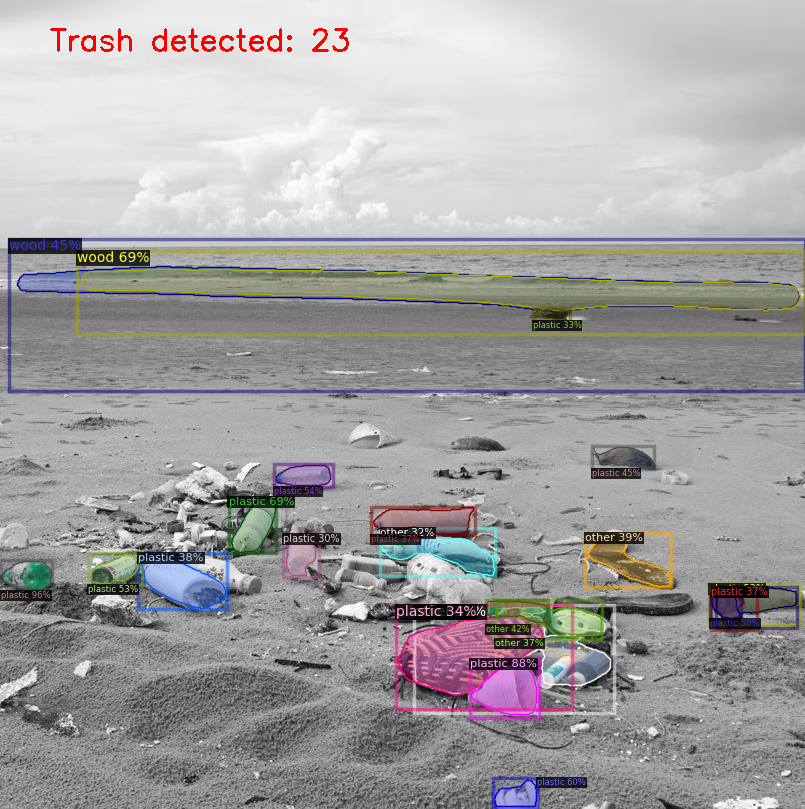

In [ ]:
import requests  # Pastikan pustaka requests diimpor
import numpy as np
import cv2
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.engine.defaults import DefaultPredictor
from google.colab.patches import cv2_imshow
import os

# Path ke model final
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3  # Confidence threshold
predictor = DefaultPredictor(cfg)

def download_image_from_url(url, save_path="input.jpg"):
    """
    Download image from a given URL and save it locally.
    """
    response = requests.get(url, stream=True)
    if response.status_code == 200:
        with open(save_path, 'wb') as file:
            file.write(response.content)
        print(f"Gambar berhasil diunduh dari {url}")
    else:
        raise Exception("Gagal mengunduh gambar. Periksa URL atau koneksi internet.")
    return save_path

# Masukkan URL gambar
image_url = "https://thecabosun.com/wp-content/uploads/2022/07/7-Trash-on-the-beach.jpg"  # Ubah ke URL gambar yang diinginkan
image_path = download_image_from_url(image_url)

# Baca gambar yang sudah diunduh
img = cv2.imread(image_path)

# Jalankan prediksi menggunakan model
outputs = predictor(img)

# Ambil prediksi
instances = outputs["instances"].to("cpu")
pred_classes = instances.pred_classes  # Kelas yang terdeteksi
pred_boxes = instances.pred_boxes      # Kotak deteksi

# Hitung jumlah objek
num_objects = len(pred_classes)

# Visualisasi
visualizer = Visualizer(
    img[:, :, ::-1],
    metadata=metadata,
    scale=1,
    instance_mode=ColorMode.IMAGE_BW
)
out = visualizer.draw_instance_predictions(instances)
img_with_predictions = out.get_image()[:, :, ::-1]

# Pastikan format array sesuai untuk OpenCV
img_with_predictions = np.ascontiguousarray(img_with_predictions)

# Tambahkan teks jumlah objek di gambar
text = f"Trash detected: {num_objects}"
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
color = (0, 0, 255)  # Warna Merah
thickness = 2
position = (50, 50)

cv2.putText(img_with_predictions, text, position, font, font_scale, color, thickness)

# Tampilkan gambar menggunakan cv2_imshow
cv2_imshow(img_with_predictions)